# Predicting Poverty from Satellite Imagery

Can we identify impovershed communities from space? This project will use economic data from the American Community Survey (ACS) and satellite imagery from Copernicus, a European remote sensing device. The results of this project - and in particular, the methods used - could be used to train models on other cities, to identify previously unnoticed pockets of poverty. 

In [46]:
# General libraries
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Census API library
import censusdata

# GIS-related libraries
import geopandas as gpd
import fiona
from shapely.geometry import MultiPolygon, Polygon
import folium
from rasterio.plot import show
from rasterio.mask import mask
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt
import rtree
import descartes 
import rasterio as rio
from pyrsgis import raster
from pyrsgis.convert import changeDimension

# Modeling libraries
from imblearn.over_sampling import RandomOverSampler
from tensorflow import keras
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix, precision_score, recall_score
from sklearn.model_selection import train_test_split

## Obtaining the Imagery: Attempt 1

There are several methods of obtaining satellite imagery, and I explored two of them. Specfically, I was looking for imagery from Sentinel2, a public satellite with a 10-day orbit (meaning you can get a new image of the same place every 10 days). Each pixel depicts 10x10m of the Earth's surface. Initially, I attempted to use the Sentinel API two pull a single satellite image of DC in June of 2019. I read in a shapefile of the geometry of DC to use as one of the parameters of my API. 

In [3]:
# Sentinel 2 Api credentials:

user = 'anizotti'
password = 'lubben000'
api = SentinelAPI(user, password, 'https://scihub.copernicus.eu/dhus')

In [4]:
# Reading in the shape file of census block groups

dc_census = gpd.read_file('./Census_Block_Groups_2010/Census_Block_Groups_2010.shp')

In [5]:
# checking the coordinate system of the shapefile

print(dc_census.crs)

{'init': 'epsg:4326'}


In [6]:
# portraying the polygons of the shapefile on the map

m = folium.Map([38.9072, -77.0369], zoom_start=12)
folium.GeoJson(dc_census).add_to(m)
#folium.GeoJson(products_gdf["geometry"][0]).add_to(m)
m

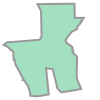

In [7]:
# Checking out the shape of the first polygon

dc_census.at[0, 'geometry']

In [8]:
# Reading in the shapefile to a geojson so that it can be submitted to the API query

data = gpd.read_file("./Census_Block_Groups_2010/Census_Block_Groups_2010.shp")
data.simplify(1).to_file('census_block_groups.geojson', driver = "GeoJSON")

In [9]:
# Asking the query for an image during the first week of June with cloud cover at 10% or less

#https://sentinelsat.readthedocs.io/en/stable/
footprint = geojson_to_wkt(read_geojson('census_block_groups.geojson'))
products = api.query(footprint,
                     date=('20190601', "20190610"),
                     platformname='Sentinel-2',
                     processinglevel = 'Level-2A',
                     cloudcoverpercentage=(0, 10))

In [10]:
# turning the results into a deodataframe

products_gdf = api.to_geodataframe(products)
products_gdf.sort_values('cloudcoverpercentage')

,title,link,link_alternative,link_icon,summary,ondemand,beginposition,endposition,ingestiondate,orbitnumber,...,processingbaseline,processinglevel,producttype,platformname,size,filename,level1cpdiidentifier,identifier,uuid,geometry
64f25189-8742-487a-a2a3-5d58ab3afcd0,S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_2...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,"Date: 2019-06-03T15:58:29.024Z, Instrument: MS...",false,2019-06-03 15:58:29.024,2019-06-03 15:58:29.024,2019-06-04 04:24:00.695,11706,...,02.12,Level-2A,S2MSI2A,Sentinel-2,541.32 MB,S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_2...,S2B_OPER_MSI_L1C_TL_SGS__20190603T194426_A0117...,S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_2...,64f25189-8742-487a-a2a3-5d58ab3afcd0,"MULTIPOLYGON (((-77.30109 38.73821, -76.97464 ..."


In [96]:
# downloading the file 

api.download('514fe466-6942-4f13-a073-4f141b4d855f')

Product 514fe466-6942-4f13-a073-4f141b4d855f is not online. Triggering retrieval from long term archive.


{'id': '514fe466-6942-4f13-a073-4f141b4d855f',
 'title': 'S2A_MSIL2A_20190228T160211_N0211_R097_T18SUJ_20190228T202323',
 'size': 593371452,
 'md5': '9BD88639CA8ACA6888A5C52369D6AFE3',
 'date': datetime.datetime(2019, 2, 28, 16, 2, 11, 24000),
 'footprint': 'POLYGON((-76.61975 39.73722157228598,-76.648346 39.65561522296203,-76.6998 39.50933212965372,-76.75113 39.36294670665201,-76.80228 39.216474954164894,-76.8533 39.06992315037253,-76.90442 38.923365720127606,-76.955536 38.776819435883,-76.96719 38.742980253603235,-77.30109 38.73820958831532,-77.33362 39.72680595308774,-76.61975 39.73722157228598))',
 'url': "https://scihub.copernicus.eu/dhus/odata/v1/Products('514fe466-6942-4f13-a073-4f141b4d855f')/$value",
 'Online': False,
 'Creation Date': datetime.datetime(2019, 3, 1, 2, 36, 33, 132000),
 'Ingestion Date': datetime.datetime(2019, 3, 1, 2, 17, 7, 293000),
 'path': './S2A_MSIL2A_20190228T160211_N0211_R097_T18SUJ_20190228T202323.zip',
 'downloaded_bytes': 0}

### Viewing methods

There are two viewing methods for raster files from the Sentinel API. One can either dig through the files to find the red, green, and blue images and then combine them using the rasterio library, or one can find the helpfully labeled "true color image" which has already done that work for you

In [12]:
# Each color band is represented in a single file, 
# so to create an RGB image they all have to be read in and combined together

R10 = 'S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_20190603T202953.SAFE/GRANULE/L2A_T18SUJ_A011706_20190603T160233/IMG_DATA/R10m'
b4 = rio.open(R10+'/T18SUJ_20190603T155829_B04_10m.jp2')
b3 = rio.open(R10+'/T18SUJ_20190603T155829_B03_10m.jp2')
b2 = rio.open(R10+'/T18SUJ_20190603T155829_B02_10m.jp2')
b8 = rio.open(R10+'/T18SUJ_20190603T155829_B08_10m.jp2')


# Create an RGB image 
with rio.open('RGB.tif','w',driver='Gtiff', width=b4.width, height=b4.height, 
              count=3,crs=b4.crs,transform=b4.transform, dtype=b4.dtypes[0]) as rgb:
    rgb.write(b2.read(1),1) 
    rgb.write(b3.read(1),2) 
    rgb.write(b4.read(1),3) 
    rgb.close()

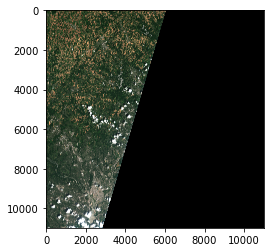

<AxesSubplot:>

In [29]:
# viewing the RGB image
rgb = rio.open(true_color_image, driver='JP2OpenJPEG') #RGB
show(rgb.read(), transform=rgb.transform)

In [15]:
# bingo, found the true color image elsewhere in the folders

true_color_image = './S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_20190603T202953.SAFE/GRANULE/L2A_T18SUJ_A011706_20190603T160233/IMG_DATA/R10m/T18SUJ_20190603T155829_TCI_10m.jp2'
tci = rio.open(true_color_image)

Text(0, 0.5, 'Row #')

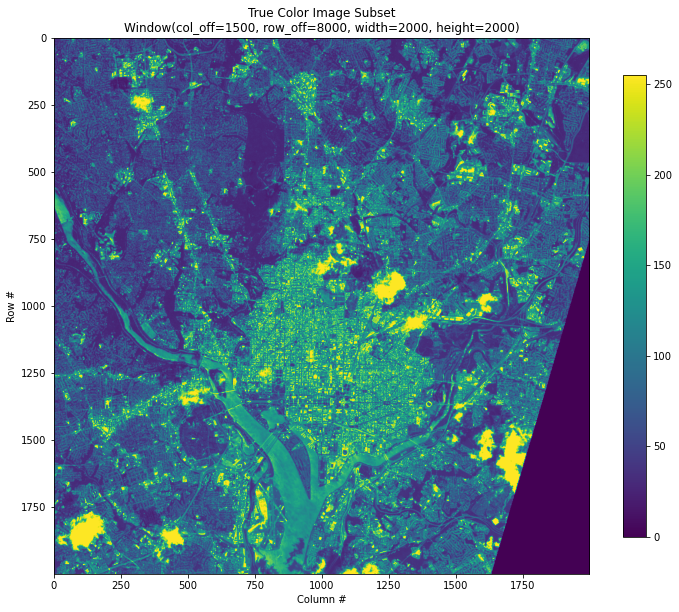

In [16]:
# Creating a window to zoom in on this image

window = rio.windows.Window(1500, 8000, 2000, 2000)

with rio.open(true_color_image) as src:
    subset = src.read(1, window=window)

plt.figure(figsize=(12,17))
plt.imshow(subset)
plt.colorbar(shrink=0.5)
plt.title(f'True Color Image Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')

### The raster file does not encompass all of DC!

As it turns out, the raster file cuts off the easternmost portions of DC. As a result, we must explore a different method of acquiring data

In [11]:
# Plotting the satellite image on top of the census tract files - it actually doesn't cover the entire city

m = folium.Map([38.9072, -77.0369], zoom_start=12)
folium.GeoJson(dc_census).add_to(m)
folium.GeoJson(products_gdf["geometry"][0]).add_to(m)
m

## Obtaining Satellite Imagery, Part 2:

The second, and ultimately more successful, attempt to gather satellite imagery involves an external tool called Google Earth Engine. Below is the Google Earth Engine code used to extract a new composite satellite image, which takes the average pixel value for each image that was produced over 6 months. Additionally, it masks clouds to give us a clearer picture. This ends up being a much better, more reliable image than the one gathered earler. The "table" referenced as a variable several times is the imported shapefile of the relevant geometry. Ultimately I pulled both DC and Chicago images (because I want to train a model on DC and test on Chicago), so I switched out that table between DC and Chicago shapefiles.

Google Earth Enginge Code Environment: https://code.earthengine.google.com/

Helpful tutorial: https://open-mrv.readthedocs.io/en/latest/image_composite_Web.html

In [ ]:
# function maskS2clouds(image) {
#   var qa = image.select('QA60');

#   // Bits 10 and 11 are clouds and cirrus, respectively.
#   var cloudBitMask = 1 << 10;
#   var cirrusBitMask = 1 << 11;

#   // Both flags should be set to zero, indicating clear conditions.
#   var mask = qa.bitwiseAnd(cloudBitMask).eq(0)
#       .and(qa.bitwiseAnd(cirrusBitMask).eq(0));

#   return image.updateMask(mask).divide(10000);
# }

# var dataset = ee.ImageCollection('COPERNICUS/S2_SR')
#                   .filterDate('2020-01-01', '2020-06-30')
#                   // Pre-filter to get less cloudy granules.
#                   .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE',10))
#                   .map(maskS2clouds)
#                   .filterBounds(table);

# var visualization = {
#   min: 0.0,
#   max: 0.3,
#   bands: ['B4', 'B3', 'B2'],
# };


# print('sentinel collection filtered',dataset);

# var composite = dataset.median().clip(table);

# Map.addLayer(composite,{bands:['B4','B3','B2'],min:0,max:0.3},
#              'Composite 2020');

# print('Sentinel composite 2020',composite);

# Map.setCenter(-77.0369, 38.9072, 12);

# Map.addLayer(table)
# Export.image.toDrive({
#   image: composite,
#   description: 's2compositeGDrive', // task name to be shown in the Tasks tab
#   fileNamePrefix: 's2composite', // filename to be saved in the Google Drive
#   scale: 10, // the spatial resolution of the image
#   region: table,
#   maxPixels: 1e13
  
# });


In [36]:
# checking out the details of the image

with rio.open('s2composite.tif') as src:
    print(src.profile)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 2343, 'height': 2274, 'count': 23, 'crs': CRS.from_epsg(4326), 'transform': Affine(8.983152841195215e-05, 0.0, -77.11982815249044,
       0.0, -8.983152841195215e-05, 38.995866483628426), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'lzw', 'interleave': 'pixel'}


### Views of DC satellite data

Text(0, 0.5, 'Row #')

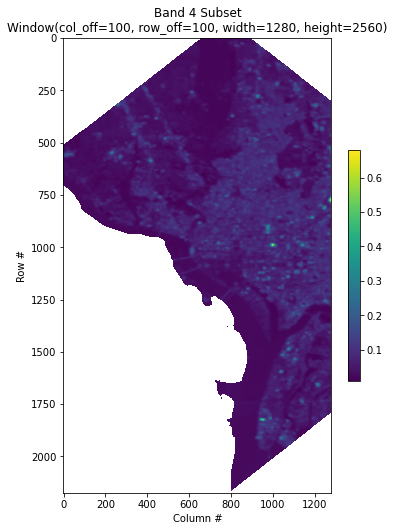

In [36]:
# Viewing a subset of the image

window = rio.windows.Window(100, 100, 1280, 2560)

with rio.open('s2composite.tif') as src:
    subset = src.read(1, window=window)

plt.figure(figsize=(6,8.5))
plt.imshow(subset)
plt.colorbar(shrink=0.5)
plt.title(f'Band 4 Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')

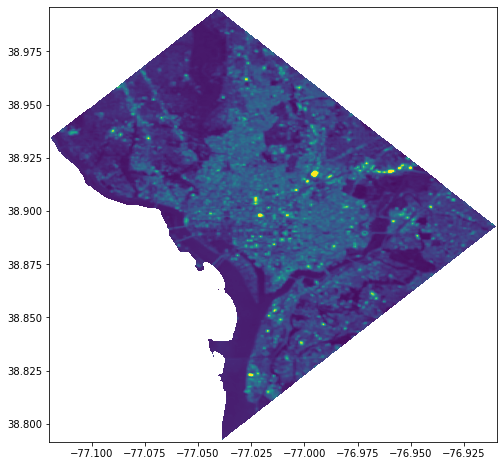

<AxesSubplot:>

In [216]:
# A different method of viewing the image, made a little brighter by restricting the pixel values

# https://towardsdatascience.com/reading-and-visualizing-geotiff-images-with-python-8dcca7a74510
from rasterio.plot import show
fp = r's2composite.tif'
img = rio.open(fp)
plt.figure(figsize=(12,8))
show(img, vmin =0, vmax = 0.3,)

In [39]:
# No. of Bands and Image resolution
print(img.count, img.height, img.width)
# Coordinate Reference System
print(img.crs)

23 2274 2343
EPSG:4326


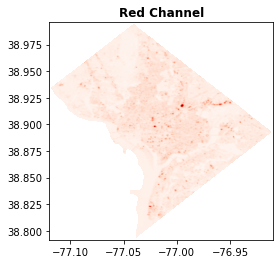

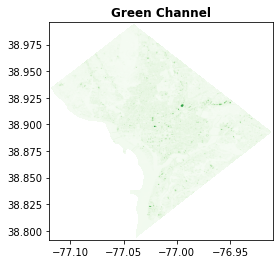

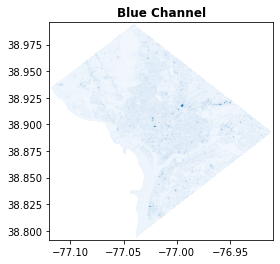

<AxesSubplot:title={'center':'Blue Channel'}>

In [40]:
# Viewing each of the R/G/B bands individually

show((img, 1), cmap='Reds', title='Red Channel')
show((img, 2), cmap='Greens', title='Green Channel')
show((img, 3), cmap='Blues', title='Blue Channel')

### View of Chicago satellite data

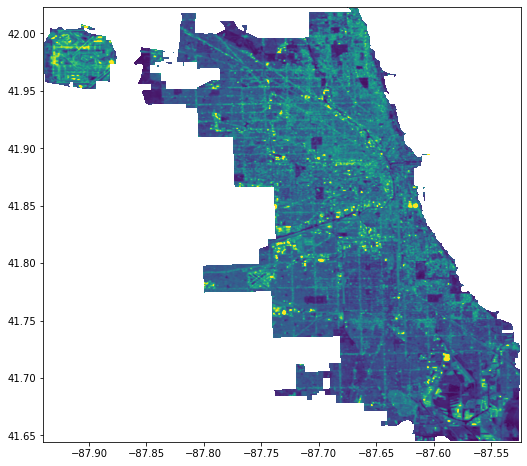

<AxesSubplot:>

In [217]:
fpc = r's2composite_chicago.tif'
imgc = rio.open(fpc)
plt.figure(figsize=(12,8))
show(imgc, vmin =0, vmax = 0.3,)

## Combining geometry and income data for DC

In order to train a model on our raster image, we need to determine what areads of DC are impoverished. Then we can create labels for our pixels, and use those as training for our model. the first step is to pull in the geometries of each census block group in DC from the extremely well-organized https://opendata.dc.gov/ . I then use the Census data wrapper to pull in the relevant information on income from the American Community Survey, which reports income information by census block group. Then I combine these two pieces of information into a single geodataframe (which is based on pandas, but is able to contain GIS properties like polygons and can perform spatial joins). I perform a similar function for the Chicago data.

In [17]:
# checking out the shapefile

dc_census.sort_values(by='GEOID').head()

,OBJECTID,TRACT,BLKGRP,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,...,OP000013,OP000014,OP000015,OP000016,H0010001,H0010002,H0010003,SHAPE_Leng,SHAPE_Area,geometry
27,28,000100,1,110010001001,1343,1323,1222,21,3,54,...,1,3,8,1,793,714,79,4339.474269,8.147889e+05,"POLYGON ((-77.06475 38.91917, -77.06383 38.918..."
28,29,000100,2,110010001002,1384,1350,1250,34,4,54,...,6,3,13,0,999,901,98,2168.618661,1.993245e+05,"POLYGON ((-77.05114 38.91062, -77.05111 38.910..."
29,30,000100,3,110010001003,1163,1150,1079,16,0,48,...,0,1,1,1,573,538,35,1874.895740,1.943297e+05,"POLYGON ((-77.05714 38.91055, -77.05714 38.910..."
0,1,000100,4,110010001004,1000,985,893,34,2,45,...,3,3,4,0,634,533,101,6569.746991,1.162392e+06,"POLYGON ((-77.05708 38.90770, -77.05707 38.907..."
1,2,000201,1,110010002011,3916,3736,2940,259,7,482,...,40,16,114,6,2,2,0,3249.765438,5.395519e+05,"POLYGON ((-77.07412 38.91259, -77.07394 38.912..."


#### Censusdata API - DC

Using the API I pulled in data from the 2019 American Community Survey for all census block groups in DC - the smallest population subset for which there is income data. I then pull out the FIPS code as an identifier. I perform some EDA on the data as well - for instance, I check out all of the values smaller than 0, and either assign them the average income of the rest of their census tract or just remove them from my analysis.

In [18]:

dc_blocks_income = censusdata.download('acs5', 2019,
                                        censusdata.censusgeo([('state', '11'), ('county', '*'), ('block group', '*')]),['B19013_001E'])
dc_blocks_income = dc_blocks_income.reset_index()
dc_blocks_income = dc_blocks_income.rename(columns={"index": "block_group_description"})
dc_blocks_income['FIPS'] = int()

# Loop over reach row and extract the 12-digit block group FIPS as an integer from its FIPS codes
for i in range(0, dc_blocks_income.shape[0]):
    dc_blocks_income['FIPS'][i] = int(''.join(re.findall(r'\d+', str(dc_blocks_income['block_group_description'][i].params()))))
dc_blocks_income.rename(columns={"B19013_001E":"median_hh_income"}, inplace=True)
dc_blocks_income.head()   

,block_group_description,median_hh_income,FIPS
0,"Block Group 2, Census Tract 88.02, District of...",32250,110010088022
1,"Block Group 3, Census Tract 88.02, District of...",72750,110010088023
2,"Block Group 3, Census Tract 96.03, District of...",35731,110010096033
3,"Block Group 1, Census Tract 96.03, District of...",43929,110010096031
4,"Block Group 2, Census Tract 96.03, District of...",72413,110010096032


In [19]:
dc_blocks_income.shape

(450, 3)

In [20]:
# obviously some funky values in there

dc_blocks_income.sort_values(by='FIPS')

,block_group_description,median_hh_income,FIPS
121,"Block Group 1, Census Tract 1, District of Col...",155938,110010001001
123,"Block Group 2, Census Tract 1, District of Col...",197773,110010001002
431,"Block Group 3, Census Tract 1, District of Col...",237109,110010001003
122,"Block Group 4, Census Tract 1, District of Col...",216513,110010001004
391,"Block Group 1, Census Tract 2.01, District of ...",-666666666,110010002011
...,...,...,...
55,"Block Group 3, Census Tract 110, District of C...",111136,110010110003
333,"Block Group 4, Census Tract 110, District of C...",110781,110010110004
265,"Block Group 1, Census Tract 111, District of C...",94667,110010111001
382,"Block Group 2, Census Tract 111, District of C...",87574,110010111002


In [186]:
# Median household income of all the census block groups
dc_blocks_income[dc_blocks_income['median_hh_income']>0]['median_hh_income'].mean()

99994.94170403587

In [22]:
# checking out the funky values, i think some of these are federal lands

dc_blocks_income[dc_blocks_income['median_hh_income']<0]

,block_group_description,median_hh_income,FIPS
35,"Block Group 2, Census Tract 108, District of C...",-666666666,110010108002
37,"Block Group 1, Census Tract 108, District of C...",-666666666,110010108001
84,"Block Group 2, Census Tract 16, District of Co...",-666666666,110010016002
117,"Block Group 1, Census Tract 49.02, District of...",-666666666,110010049021
138,"Block Group 3, Census Tract 21.02, District of...",-666666666,110010021023
156,"Block Group 3, Census Tract 76.05, District of...",-666666666,110010076053
158,"Block Group 4, Census Tract 77.03, District of...",-666666666,110010077034
167,"Block Group 2, Census Tract 78.09, District of...",-666666666,110010078092
180,"Block Group 1, Census Tract 19.01, District of...",-666666666,110010019011
189,"Block Group 1, Census Tract 62.02, District of...",-666666666,110010062021


In [23]:
# Some of these areas are completely enclosed by other census bock groups, so I thought I would replace those
# values with the average of the census tract. The rest I will drop.

for row in range(len(dc_blocks_income)):
    if dc_blocks_income['median_hh_income'][row]<0:
        tract = str(dc_blocks_income['block_group_description'][row]).split(" ")[5]
        count = 0
        sum_inc= 0
        for row2 in range(len(dc_blocks_income)):
            tract2 = str(dc_blocks_income['block_group_description'][row2]).split(" ")[5]
            if (row2 != row) & (tract == tract2):
                sum_inc += dc_blocks_income['median_hh_income'][row2]
                count +=1
        
        if count > 0:
            dc_blocks_income.at[row, 'median_hh_income']= sum_inc/count
        
dc_blocks_income[dc_blocks_income['median_hh_income']<0]

,block_group_description,median_hh_income,FIPS
35,"Block Group 2, Census Tract 108, District of C...",-333297708,110010108002
37,"Block Group 1, Census Tract 108, District of C...",-166613229,110010108001
189,"Block Group 1, Census Tract 62.02, District of...",-666666666,110010062021
391,"Block Group 1, Census Tract 2.01, District of ...",-666666666,110010002011


In [24]:
# Have to switch this to an object in order to merge it with the shape file

dc_blocks_income['FIPS_abc'] = [str(fips) for fips in dc_blocks_income['FIPS']]

In [25]:
# Merging the census polygons with the income data, and dropping the tracts that have incomes below 0

dc = pd.merge(dc_census, dc_blocks_income, left_on='GEOID', right_on='FIPS_abc')
dc= dc[dc['median_hh_income']>0] 
dc=dc.drop(columns=['block_group_description','FIPS_abc'])
dc.head()

,OBJECTID,TRACT,BLKGRP,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,...,OP000015,OP000016,H0010001,H0010002,H0010003,SHAPE_Leng,SHAPE_Area,geometry,median_hh_income,FIPS
0,1,000100,4,110010001004,1000,985,893,34,2,45,...,4,0,634,533,101,6569.746991,1.162392e+06,"POLYGON ((-77.05708 38.90770, -77.05707 38.907...",216513,110010001004
2,3,000202,1,110010002021,1196,1177,1081,25,2,56,...,6,3,604,547,57,2684.900636,1.920121e+05,"POLYGON ((-77.06568 38.91183, -77.06553 38.911...",250001,110010002021
3,4,000202,2,110010002022,813,792,749,3,1,35,...,6,0,395,366,29,1505.972723,1.355407e+05,"POLYGON ((-77.06890 38.90774, -77.06904 38.907...",217056,110010002022
4,5,000202,3,110010002023,1053,1032,954,15,1,57,...,8,1,505,455,50,1615.539725,1.544660e+05,"POLYGON ((-77.06702 38.90509, -77.06783 38.905...",185465,110010002023
5,6,000600,1,110010006001,1127,1098,983,34,3,56,...,7,2,694,657,37,2116.495226,2.148784e+05,"POLYGON ((-77.06152 38.94074, -77.06123 38.940...",109716,110010006001


In [26]:
# Keeping just the critical information
dc_subset = dc[['GEOID','median_hh_income','geometry']]
dc_subset.head()

,GEOID,median_hh_income,geometry
0,110010001004,216513,"POLYGON ((-77.05708 38.90770, -77.05707 38.907..."
2,110010002021,250001,"POLYGON ((-77.06568 38.91183, -77.06553 38.911..."
3,110010002022,217056,"POLYGON ((-77.06890 38.90774, -77.06904 38.907..."
4,110010002023,185465,"POLYGON ((-77.06702 38.90509, -77.06783 38.905..."
5,110010006001,109716,"POLYGON ((-77.06152 38.94074, -77.06123 38.940..."


In [49]:
dc_subset=dc_subset.set_index("GEOID")

In [30]:
# reading the block groups (unsimplified version) into a geojson to plot

data = gpd.read_file("./Census_Block_Groups_2010/Census_Block_Groups_2010.shp")
data.to_file('census_block_groups_unsimplified.geojson', driver = "GeoJSON")

<AxesSubplot:>

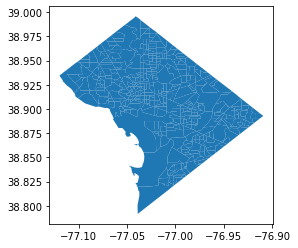

In [31]:
# plotting the block groups

gdf = gpd.read_file('census_block_groups_unsimplified.geojson')
gdf.plot()

#### Censusdata API - Chicago

I perform a very similar function here for Chicago data. The key difference is that I can only pull census data and gemetries for all of the census block groups in Cook County - not just Chicago. Consequently, I had to download the boundary of Chicago (that and all other geometric information can be found here - https://data.cityofchicago.org/) and filter the census block groups using a spatial join to determine all of the relevant polygons "within" the Chicago boundary.

In [189]:
chicago_blocks_income = censusdata.download('acs5', 2019,
                                        censusdata.censusgeo([('state', '17'), ('county', '031'), ('block group', '*')]),['B19013_001E'])
chicago_blocks_income = chicago_blocks_income.reset_index()
chicago_blocks_income = chicago_blocks_income.rename(columns={"index": "block_group_description"})
chicago_blocks_income['FIPS'] = int()

# Loop over reach row and extract the 12-digit block group FIPS as an integer from its FIPS codes
for i in range(0, chicago_blocks_income.shape[0]):
    chicago_blocks_income['FIPS'][i] = int(''.join(re.findall(r'\d+', str(chicago_blocks_income['block_group_description'][i].params()))))
chicago_blocks_income.rename(columns={"B19013_001E":"median_hh_income"}, inplace=True)
chicago_blocks_income.head()   

,block_group_description,median_hh_income,FIPS
0,"Block Group 1, Census Tract 8089, Cook County,...",187500,170318089001
1,"Block Group 3, Census Tract 8089, Cook County,...",127019,170318089003
2,"Block Group 1, Census Tract 8098, Cook County,...",83750,170318098001
3,"Block Group 3, Census Tract 8101, Cook County,...",87115,170318101003
4,"Block Group 4, Census Tract 8101, Cook County,...",80083,170318101004


In [190]:
# Number of census block groups in Cook County
chicago_blocks_income.shape

(3993, 3)

In [191]:
# Median household income of all the census block groups
chicago_blocks_income[chicago_blocks_income['median_hh_income']>0]['median_hh_income'].mean()

72749.18422431865

In [192]:
# Checking out the block groups below 0
chicago_blocks_income[chicago_blocks_income['median_hh_income']<0]

,block_group_description,median_hh_income,FIPS
9,"Block Group 1, Census Tract 8093, Cook County,...",-666666666,170318093001
36,"Block Group 2, Census Tract 813, Cook County, ...",-666666666,170310813002
53,"Block Group 1, Census Tract 7502, Cook County,...",-666666666,170317502001
78,"Block Group 5, Census Tract 1101, Cook County,...",-666666666,170311101005
100,"Block Group 4, Census Tract 8255.05, Cook Coun...",-666666666,170318255054
...,...,...,...
3811,"Block Group 2, Census Tract 8382, Cook County,...",-666666666,170318382002
3832,"Block Group 4, Census Tract 207.02, Cook Count...",-666666666,170310207024
3891,"Block Group 1, Census Tract 4212, Cook County,...",-666666666,170314212001
3903,"Block Group 3, Census Tract 4908, Cook County,...",-666666666,170314908003


In [193]:
# Converting the id column to a string in order to join in to the string in the geometry table
chicago_blocks_income['FIPS_abc'] = [str(fips) for fips in chicago_blocks_income['FIPS']]

In [208]:
# Converting the census tract to a geojson to plot it 
chicago_census = gpd.read_file("./Boundaries - Census Tracts - 2010/geo_export_6c90d22b-9e9d-4955-acf5-8197040bb292.shp")
chi_data.to_file('census_block_groups_chicago.geojson', driver = "GeoJSON")

<AxesSubplot:>

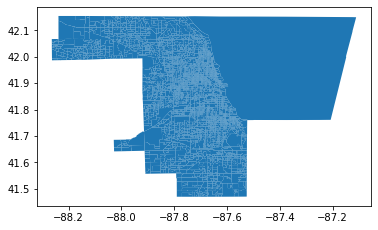

In [209]:
# Plotting the geojson
c = gpd.read_file('census_block_groups_chicago.geojson')
c.plot()

In [201]:
# Merging the census polygons with the income data, and dropping the tracts that have incomes below 0

chicago = pd.merge(chicago_census, chicago_blocks_income, left_on='BLKGRPID', right_on='FIPS_abc')
chicago= chicago[chicago['median_hh_income']>0] 
chicago=chicago.drop(columns=['block_group_description','FIPS_abc'])
chicago.head()

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,BLKGRPID,CHNG_TYPE,EFF_DATE,BGTYP,RELATE,JUSTIFY,VINTAGE,geometry,median_hh_income,FIPS
1,17,031,010100,2,170310101002,None,None,None,None,None,None,"POLYGON ((-87.67720 42.02294, -87.67628 42.022...",21827,170310101002
2,17,031,010100,3,170310101003,None,None,None,None,None,None,"POLYGON ((-87.67265 42.02300, -87.67188 42.023...",54297,170310101003
3,17,031,010300,2,170310103002,None,None,None,None,None,None,"POLYGON ((-87.67133 42.01937, -87.67121 42.019...",51133,170310103002
4,17,031,030604,2,170310306042,None,None,None,None,None,None,"POLYGON ((-87.65532 41.98809, -87.65529 41.988...",62935,170310306042
5,17,031,030702,1,170310307021,None,None,None,None,None,None,"POLYGON ((-87.65511 41.98072, -87.65409 41.980...",64792,170310307021


In [202]:
# Keeping just the critical information
chicago_subset = chicago[['BLKGRPID','median_hh_income','geometry']]
chicago_subset.head()

,BLKGRPID,median_hh_income,geometry
1,170310101002,21827,"POLYGON ((-87.67720 42.02294, -87.67628 42.022..."
2,170310101003,54297,"POLYGON ((-87.67265 42.02300, -87.67188 42.023..."
3,170310103002,51133,"POLYGON ((-87.67133 42.01937, -87.67121 42.019..."
4,170310306042,62935,"POLYGON ((-87.65532 41.98809, -87.65529 41.988..."
5,170310307021,64792,"POLYGON ((-87.65511 41.98072, -87.65409 41.980..."


In [210]:
# Reading in the boundary of the city of Chicago
chicago_boundary = gpd.read_file("./Boundaries - City/geo_export_cf8dc551-a25f-474a-8189-d517116c440a.shp")
chicago_boundary

,name,objectid,shape_area,shape_len,geometry
0,CHICAGO,1.0,6.450277e+09,845282.931362,"MULTIPOLYGON (((-87.93514 42.00089, -87.93521 ..."


<AxesSubplot:>

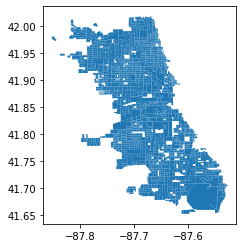

In [213]:
# Performing the spatial join so that only the census block groups within the Chicago city
# are counted, instead of the whole county
chicago_cbg = gpd.sjoin(chicago_subset, chicago_boundary, how="inner", op='within')
chicago_cbg.plot()

### Some experimentation with the initial piece of Satellite imagery

In [27]:
# Calculating the normalized difference water index (something the internet said was useful)

green = b3.read()
nir = b8.read()
ndwi = (nir.astype(float)-green.astype(float))/(nir+green)

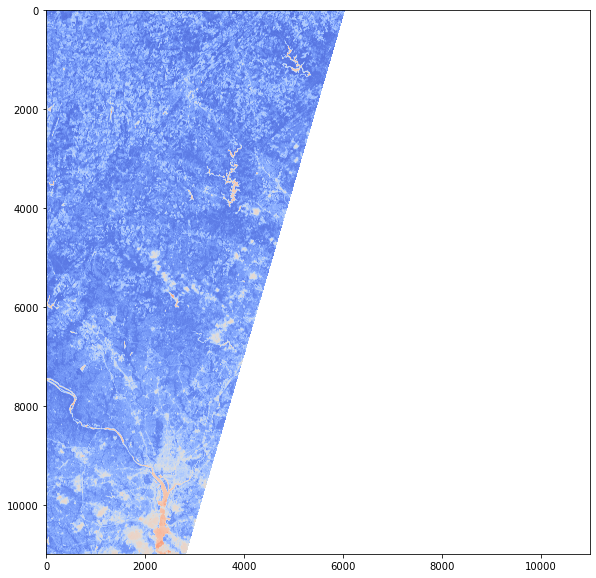

In [28]:
fig, ax = plt.subplots(1, figsize=(12, 10))
show(ndwi, ax=ax, cmap='coolwarm_r')
plt.show()

In [33]:
# Writing the new calculated band into its own file

meta = b4.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)
with rio.open('NDWI.tif', 'w', **meta) as dst:
     dst.write(ndwi.astype(rio.float32))
# Read the saved 
ndwi_raster = rio.open('NDWI.tif')

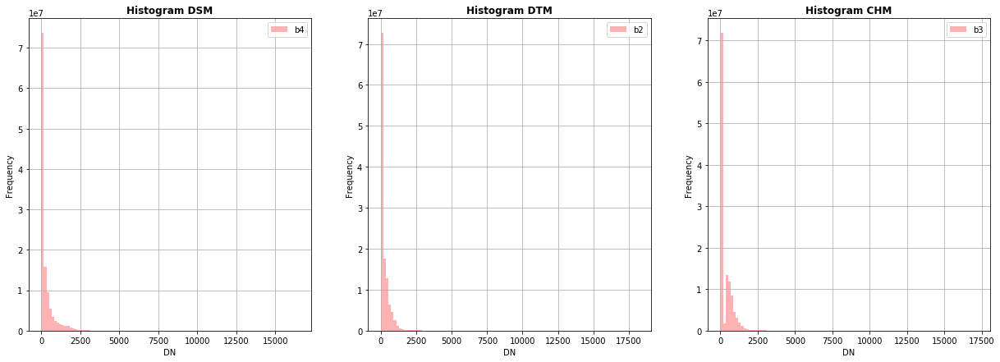

In [64]:
# Histograms of the red, green, and blue color bands

from rasterio.plot import show_hist
fig, (axb4, axb2, axb3) = plt.subplots(1, 3, figsize=(21, 7))
show_hist(b4, ax=axdsm, bins=100, lw=0.0, stacked=False, alpha=0.3, title="Histogram band 4")
show_hist(b2, ax=axdtm, bins=100, lw=0.0, stacked=False, alpha=0.3, title="Histogram band 2")
show_hist(b3, ax=axchm, bins=100, lw=0.0, stacked=False, alpha=0.3, title="Histogram band 3")
axdsm.legend(['b4'])
axdtm.legend(['b2'])
axchm.legend(['b3'])
plt.show()

## Plot of Income Data

Just to make sure that worked...

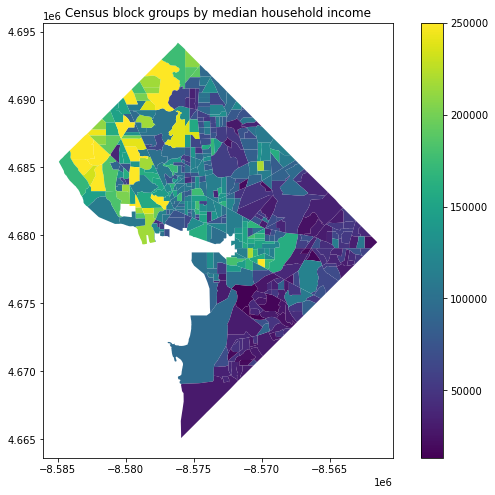

In [33]:
test = dc_subset.set_index("GEOID")
test = test.to_crs("EPSG:3395")
test['area'] = test.area

test.plot("median_hh_income",legend=True,figsize= (10,8))
plt.title("Census block groups by median household income")
plt.show()

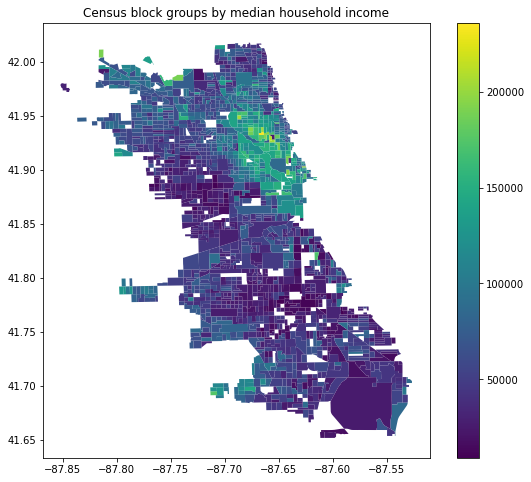

In [215]:
test_chi = chicago_cbg.set_index("BLKGRPID")
test_chi['area'] = test_chi.area

test_chi.plot("median_hh_income",legend=True,figsize= (10,8))
plt.title("Census block groups by median household income")
plt.show()

## Plotting Income Data on the Satellite Image

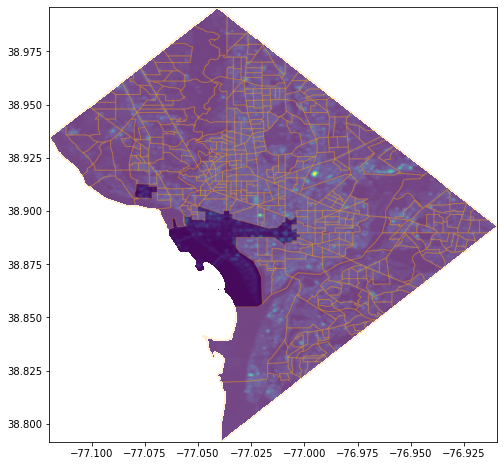

In [50]:
# Plotting all the block groups (minus the ones i dropped)
from rasterio.plot import show
fp = r's2composite.tif'
img = rasterio.open(fp)

fig, ax = plt.subplots(figsize=(10, 8))
show(img, ax=ax)
dc_subset.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.25,color='white', edgecolor= 'orange')

plt.show();

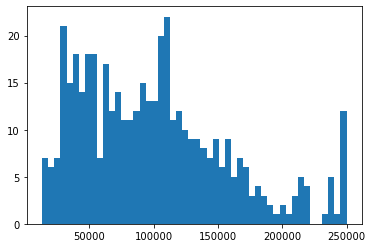

In [51]:
# Checking out the distribution of income

plt.hist(dc_subset['median_hh_income'], bins = 50);

In [52]:
# The federal poverty level is just about 25,000 per 4-person household

#https://www.dcfpi.org/all/income-inequality-dc-highest-country/
dc_poverty = dc_subset[dc_subset['median_hh_income']<25000]

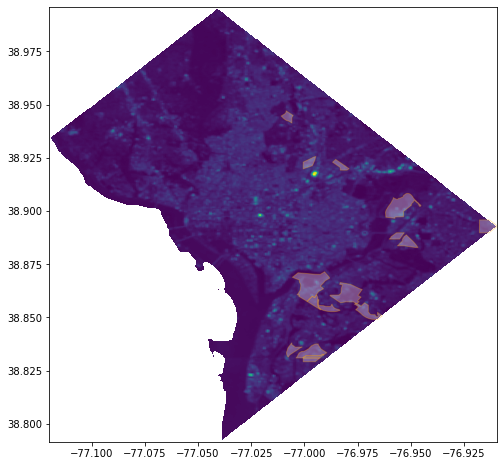

In [53]:
# Census Block Groups below the federal poverty level

from rasterio.plot import show
fp = r's2composite.tif'
img = rasterio.open(fp)

fig, ax = plt.subplots(figsize=(10, 8))
show(img, ax=ax)
dc_poverty.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.3,color='white', edgecolor= 'orange')

plt.show();

In [54]:
dc_poverty_col = dc_subset[dc_subset['median_hh_income']<34750]


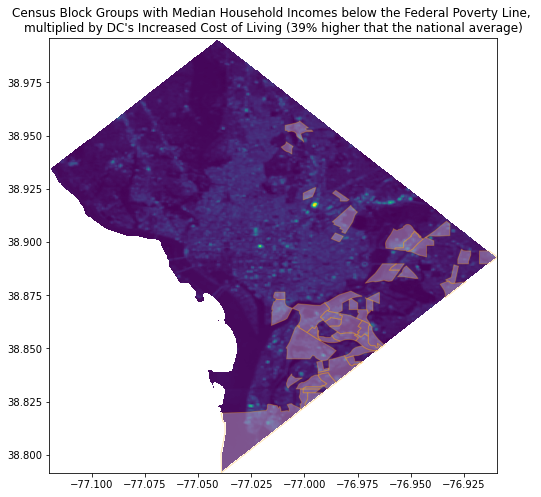

In [55]:
# Census Block Groups with Median Household Incomes below the Federal Poverty Line, 
# multiplied by DC's Increased Cost of Living (39% higher that the national average)

from rasterio.plot import show
fp = r's2composite.tif'
img = rio.open(fp)

fig, ax = plt.subplots(figsize=(10, 8))
show(img, ax=ax)
dc_poverty_col.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.3,color='white', edgecolor= 'orange')
plt.title("DC Census Block Groups with Median Household Incomes below the Federal Poverty Line, \nmultiplied by DC's Increased Cost of Living (39% higher that the national average)")
plt.show();

In [218]:
chi_poverty_col = chicago_cbg[chicago_cbg['median_hh_income']<30750]

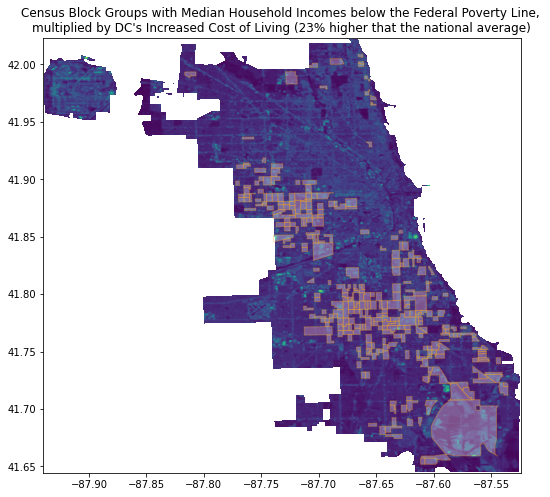

In [219]:
# Census Block Groups with Median Household Incomes below the Federal Poverty Line, 
# multiplied by Chicago's Increased Cost of Living (23% higher that the national average)

from rasterio.plot import show
fpc = r's2composite_chicago.tif'
imgc = rio.open(fpc)

fig, ax = plt.subplots(figsize=(10, 8))
show(imgc, ax=ax)
chi_poverty_col.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.3,color='white', edgecolor= 'orange')
plt.title("Chicago Census Block Groups with Median Household Incomes below the Federal Poverty Line, \nmultiplied by DC's Increased Cost of Living (23% higher that the national average)")
plt.show();

# Next step: rasterize the shape file of impoverished census block groups!!

-----

In [56]:
dc_poverty_col.head()

,median_hh_income,geometry
GEOID,,
110010064001,29398,"POLYGON ((-77.00910 38.87648, -77.00910 38.875..."
110010064002,31198,"POLYGON ((-77.01277 38.87297, -77.01228 38.872..."
110010074093,25720,"POLYGON ((-76.97628 38.84388, -76.97626 38.843..."
110010075021,27610,"POLYGON ((-76.96998 38.85748, -76.96997 38.856..."
110010075022,29750,"POLYGON ((-76.96352 38.85264, -76.96322 38.852..."


In [238]:
# https://towardsdatascience.com/neural-network-for-satellite-data-classification-using-tensorflow-in-python-a13bcf38f3e1
# Rasterizing DC's income data to use as a label in the model

src = rio.open('s2composite.tif')

    
image = rio.features.rasterize(
            ((g, 255) for g in dc_poverty_col['geometry']),
            out_shape=src.shape,
            transform=src.transform)

with rio.open(
        'income_labels.tif', 'w',
        driver='GTiff',
        dtype=rio.uint8,
        count=1,
        width=src.width,
        height=src.height) as dst:
    dst.write(image, indexes=1)

In [239]:
src = rio.open('s2composite_chicago.tif')

    
image = rio.features.rasterize(
            ((g, 255) for g in chi_poverty_col['geometry']),
            out_shape=src.shape,
            transform=src.transform)

with rio.open(
        'income_labels_chi.tif', 'w',
        driver='GTiff',
        dtype=rio.uint8,
        count=1,
        width=src.width,
        height=src.height) as dst:
    dst.write(image, indexes=1)

In [247]:
ds1, features_dc = raster.read('s2composite.tif', bands='all')
ds2, labels_dc = raster.read('income_labels.tif', bands=1)
ds3, features_chi = raster.read('s2composite_chicago.tif', bands='all')
ds4, labels_chi = raster.read('income_labels_chi.tif', bands=1)

In [248]:
print(features_dc.shape)
print(labels_dc.shape)
print(features_chi.shape)
print(labels_chi.shape)

(23, 2274, 2343)
(2274, 2343)
(23, 4215, 4631)
(4215, 4631)


In [150]:
np.sort(features_dc[1])*1000000

array([[24800.00071228, 25149.9991864 ,            nan, ...,
                   nan,            nan,            nan],
       [24800.00071228, 24800.00071228, 29650.00085533, ...,
                   nan,            nan,            nan],
       [23700.00071824, 26550.00053346, 29349.9995023 , ...,
                   nan,            nan,            nan],
       ...,
       [42899.99976754, 42899.99976754, 42950.00061393, ...,
                   nan,            nan,            nan],
       [41450.00129938, 42399.99875426, 42399.99875426, ...,
                   nan,            nan,            nan],
       [41850.00061989,            nan,            nan, ...,
                   nan,            nan,            nan]])

In [153]:
np.count_nonzero(features_dc)

111693758

In [154]:
np.count_nonzero(~np.isnan(features_dc[12][2273]))
#(23*2274*2343)
#features_dc[12][0].shape

1

In [249]:
features_dc_cd = changeDimension(features_dc*100000)
labels_dc_cd = changeDimension (labels_dc)
features_chi_cd= changeDimension(features_chi*100000)
labels_chi_cd = changeDimension (labels_chi)
nBands = features_dc_cd.shape[1]
#features_dc_cd = (features_dc_cd == 1).astype(int)

print("DC multispectral image shape: ", features_dc_cd.shape)
print("DC binary income image shape: ", labels_dc_cd.shape)
print("Chicago multispectral image shape: ", features_chi_cd.shape)
print("Chicago binary income image shape: ", labels_chi_cd.shape)

DC multispectral image shape:  (5327982, 23)
DC binary income image shape:  (5327982,)
Chicago multispectral image shape:  (19519665, 23)
Chicago binary income image shape:  (19519665,)


In [250]:
labels_dc_cd = labels_dc_cd/255
labels_chi_cd = labels_chi_cd/255

In [244]:
np.count_nonzero(~np.isnan(features_dc_cd))

122543586

In [245]:
np.max(la_dc_cd)

107879

## Training a model on the DC data and testing on the Chicago data

In [251]:
X_train, X_test, y_train, y_test = train_test_split(features_dc_cd, labels_dc_cd, test_size=0.4, random_state=23, stratify=labels_dc_cd)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)


(3196789, 23)
(3196789,)
(2131193, 23)
(2131193,)


In [127]:
np.count_nonzero(X_train==0)

6505058

In [252]:
# Normalise the data
X_train = X_train / 100000.0
X_test = X_test / 100000.0
features_chi_cd = features_chi_cd / 100000.0

# Reshape the data
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
features_chi_cd = features_chi_cd.reshape((features_chi_cd.shape[0], 1, features_chi_cd.shape[1]))

# Print the shape of reshaped data
print(X_train.shape, X_test.shape, 
      features_chi_cd.shape
     )

(3196789, 1, 23) (2131193, 1, 23) (19519665, 1, 23)


In [259]:
# Define the parameters of the model
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(1, nBands)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')])

# Define the accuracy metrics and parameters
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

# Run the model
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto', restore_best_weights=True)
model.fit(x = X_train, y= y_train, validation_data = (X_test,y_test), epochs=10, callbacks=early_stop)

Epoch 1/10
99900/99900 [==============================] - 165s 2ms/step - loss: 915507443.4168 - accuracy: 0.9438 - val_loss: 0.1506 - val_accuracy: 0.9469
Epoch 2/10
99900/99900 [==============================] - 167s 2ms/step - loss: 0.1511 - accuracy: 0.9466 - val_loss: 0.1459 - val_accuracy: 0.9476
Epoch 3/10
99900/99900 [==============================] - 178s 2ms/step - loss: 0.1463 - accuracy: 0.9477 - val_loss: 0.1450 - val_accuracy: 0.9478
Epoch 4/10
99900/99900 [==============================] - 176s 2ms/step - loss: 0.1437 - accuracy: 0.9482 - val_loss: 0.1429 - val_accuracy: 0.9479
Epoch 5/10
99900/99900 [==============================] - 166s 2ms/step - loss: 0.1415 - accuracy: 0.9488 - val_loss: 0.1377 - val_accuracy: 0.9504
Epoch 6/10
99900/99900 [==============================] - 181s 2ms/step - loss: 0.1373 - accuracy: 0.9506 - val_loss: 0.1325 - val_accuracy: 0.9524
Epoch 7/10
99900/99900 [==============================] - 184s 2ms/step - loss: 0.1350 - accuracy: 0.951

In [135]:
1-np.mean(labels_dc_cd)

0.9430146348092017

In [265]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score

# Predict for test data 
y_test_predicted = model.predict(X_test)

# Calculate and display the error metrics
y_test_predicted = (y_test_predicted>0.5).astype(int)
confusion_matrix_model1 = confusion_matrix(y_test, y_test_predicted)
pScore = precision_score(y_test, y_test_predicted)
rScore = recall_score(y_test, y_test_predicted)

print("Confusion matrix: for >200,000 nodes\n", confusion_matrix_model1)
print(f"\nP-Score: {pScore}, R-Score: {rScore}")

Confusion matrix: for >200,000 nodes
 [[1992296   17450]
 [  83690   37757]]

P-Score: 0.6839168945966997, R-Score: 0.31089281744299985


In [262]:
model.evaluate(X_test, y_test, verbose=1)

66600/66600 [==============================] - 55s 826us/step - loss: 0.1307 - accuracy: 0.9525


[0.1306518316268921, 0.9525430202484131]

In [165]:
from imblearn.over_sampling import RandomOverSampler
oversample = RandomOverSampler(sampling_strategy='minority')
X_over, y_over = oversample.fit_resample(features_dc_cd, labels_dc_cd)

In [168]:
X_train, X_test, y_train, y_test = train_test_split(features_dc_cd, labels_dc_cd, test_size=0.4, random_state=23, stratify=labels_dc_cd)

oversample = RandomOverSampler(sampling_strategy='minority')
X_train_over, y_train_over = oversample.fit_resample(X_train, y_train)

# Normalise the data
X_train_over = X_train_over / 255.0
X_test = X_test / 255.0
#featuresHyderabad = featuresHyderabad / 255.0

# Reshape the data
X_train_over = X_train_over.reshape((X_train_over.shape[0], 1, X_train_over.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
#featuresHyderabad = featuresHyderabad.reshape((featuresHyderabad.shape[0], 1, featuresHyderabad.shape[1]))

# Print the shape of reshaped data
print(X_train_over.shape, X_test.shape, 
      #featuresHyderabad.shape
     )

(6029238, 1, 23) (2131193, 1, 23)


In [169]:
np.mean(y_train_over)

0.5

In [170]:
from tensorflow import keras
from tensorflow.keras.callbacks import EarlyStopping

# Define the parameters of the model
model2 = keras.Sequential([
    keras.layers.Flatten(input_shape=(1, nBands)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')])

# Define the accuracy metrics and parameters
model2.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

# Run the model
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto', restore_best_weights=True)
model2.fit(x=X_train_over, y=y_train_over, validation_data=((X_test,y_test)), epochs=10, callbacks=early_stop)

Epoch 1/10
188414/188414 [==============================] - 333s 2ms/step - loss: 6137143063.2220 - accuracy: 0.8166
Epoch 2/10
188414/188414 [==============================] - 303s 2ms/step - loss: 993087665.9177 - accuracy: 0.8326
Epoch 3/10
188414/188414 [==============================] - 306s 2ms/step - loss: 0.3404 - accuracy: 0.8367
Epoch 4/10
188414/188414 [==============================] - 297s 2ms/step - loss: 11169011365.9899 - accuracy: 0.8383
Epoch 5/10
188414/188414 [==============================] - 292s 2ms/step - loss: 1029181480.2558 - accuracy: 0.8407
Epoch 6/10
188414/188414 [==============================] - 286s 2ms/step - loss: 0.3266 - accuracy: 0.8404
Epoch 7/10
188414/188414 [==============================] - 280s 1ms/step - loss: 0.3226 - accuracy: 0.8429
Epoch 8/10
188414/188414 [==============================] - 302s 2ms/step - loss: 0.3218 - accuracy: 0.8435
Epoch 9/10
188414/188414 [==============================] - 281s 1ms/step - loss: 0.3205 - accuracy:

In [174]:
model2.evaluate(X_test, y_test, verbose=1)

66600/66600 [==============================] - 49s 739us/step - loss: 0.3601 - accuracy: 0.7663


[0.3601360619068146, 0.7662708163261414]

In [175]:
# Predict for test data 
y_test_predicted = model2.predict(X_test)
y_test_predicted = y_test_predicted[:,1]

In [177]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score


# Calculate and display the error metrics
y_test_predicted = (y_test_predicted>0.5).astype(int)
confusion_matrix2 = confusion_matrix(y_test, y_test_predicted)
pScore = precision_score(y_test, y_test_predicted)
rScore = recall_score(y_test, y_test_predicted)

print("Confusion matrix: for >200,000 nodes\n", confusion_matrix)
print(f"\nP-Score: {pScore}, R-Score: {rScore}")

Confusion matrix: for >200,000 nodes
 [[1519042  490704]
 [   7418  114029]]

P-Score: 0.18856090208406023, R-Score: 0.9389198580450732


## Prediction of Chicago

In [267]:
predicted = model.predict(features_chi_cd)
#predicted = predicted[:,1]

#Export raster
prediction = np.reshape(predicted, (ds3.RasterYSize, ds3.RasterXSize))
outFile = 'chicago_income_predicted.tif'
raster.export(prediction, ds3, filename=outFile, dtype='float')

In [268]:
np.max(predicted)

0.99999446

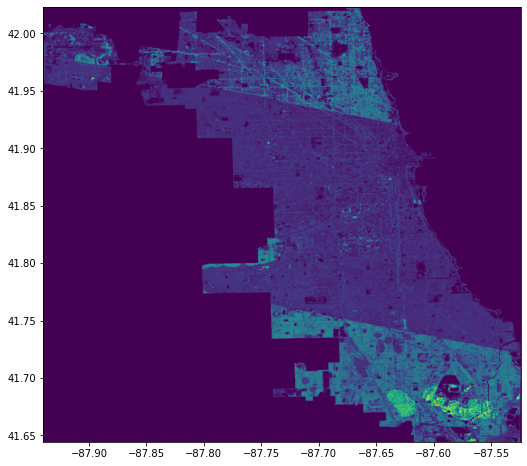

<AxesSubplot:>

In [269]:
fpp = r'chicago_income_predicted.tif'
imgp = rio.open(fpp)
plt.figure(figsize=(12,8))
show(imgp, )

## Training a model on the Chicago data and testing on the DC data

##### Random stuff below this line

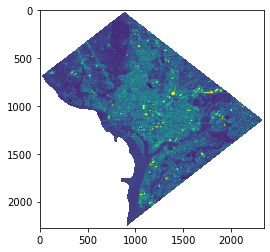

<AxesSubplot:>

In [115]:
import numpy as np
new_img = np.dstack((b1, b2, b3))
f = plt.figure()
#plt.imshow(new_img)
#plt.show()
show(b3, vmin = 0, vmax = 0.3)

In [117]:
b3.shape

(2274, 2343)

In [122]:
test_b3 = np.nan_to_num(b3, nan=0)

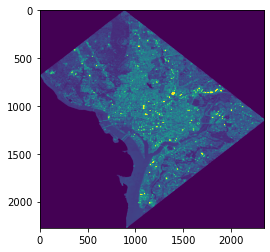

<AxesSubplot:>

In [133]:
show(test_b3, vmin = 0, vmax = 0.3)

In [129]:
dc_poverty_col.drop(columns = 'median_hh_income').to_file('census_block_groups_pov.geojson', driver = "GeoJSON")
gdf_pov = gpd.read_file('census_block_groups_pov.geojson', driver = "GeoJSON")
gdf_pov.head()

,geometry
0,"POLYGON ((-77.00910 38.87648, -77.00910 38.875..."
1,"POLYGON ((-77.01277 38.87297, -77.01228 38.872..."
2,"POLYGON ((-76.97628 38.84388, -76.97626 38.843..."
3,"POLYGON ((-76.96998 38.85748, -76.96997 38.856..."
4,"POLYGON ((-76.96352 38.85264, -76.96322 38.852..."
